In [1]:
!nvidia-smi

Tue Nov 30 12:28:31 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.36.06    Driver Version: 450.36.06    CUDA Version: 11.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Quadro RTX 4000     On   | 00000000:00:05.0 Off |                  N/A |
| 30%   29C    P8    11W / 125W |      1MiB /  7982MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
from sklearn.metrics import r2_score,accuracy_score, confusion_matrix, classification_report,precision_recall_fscore_support
import numpy as np
import pandas as pd
import sklearn

import dask_ml.model_selection as dcv
import dask.dataframe as dd
from dask_ml.preprocessing import RobustScaler as dask_RobustScaler

import xgboost as xgb
import lightgbm as lgb
from catboost import CatBoostRegressor, Pool, EShapCalcType, EFeaturesSelectionAlgorithm

from sklearn.model_selection import RepeatedKFold
from cuml.model_selection import train_test_split
from sklearn.model_selection import train_test_split as skl_train_test_split
from sklearn.preprocessing import RobustScaler
from cuml.preprocessing import RobustScaler as cuml_RobustScaler

from bayes_opt import BayesianOptimization

from cuml import preprocessing
import cuml

from cuml.ensemble import RandomForestClassifier as cuRFC
from cuml.neighbors import KNeighborsRegressor
from cuml.ensemble import RandomForestRegressor as curfc

from sklearn.decomposition import PCA

cuml.set_global_output_type('numpy')
import cudf
import numpy as np
from joblib import dump, load
import warnings
warnings.filterwarnings('ignore')

import cupy
import matplotlib.pyplot as plt
from matplotlib import pyplot
plt.rcParams["figure.figsize"] = (20,20)

In [3]:
def metric_scores_rgr(x,y):
    met = np.abs(pd.Series(y-x))
    f_out = met/(1+x.astype(np.float32))
    nmad=1.48*np.median(f_out)
    bias = np.median(f_out)
    y_outlier = pd.Series(np.where(f_out > 0.15, 'outlier', 'not outlier'))
    print("Outliers: \n", y_outlier.value_counts())
    print("\n Bias: \n", bias)
    print("\n NMAD score: \n", nmad)
    print('\n R2 Test: \n', r2_score(x, y))
    pass
    
import seaborn as sns
def plot_feature_importance(importance,names,model_type):
    
    #Create arrays from feature importance and feature names
    feature_importance = np.array(importance)
    feature_names = np.array(names)
    
    #Create a DataFrame using a Dictionary
    data={'feature_names':feature_names,'feature_importance':feature_importance}
    fi_df = pd.DataFrame(data)
    
    #Sort the DataFrame in order decreasing feature importance
    fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)
    
    #Define size of bar plot
    plt.figure(figsize=(20,20))
    #Plot Searborn bar chart
    sns.barplot(x=fi_df['feature_importance'], y=fi_df['feature_names'])
    #Add chart labels
    plt.title(model_type + ' Feature Importance')
    plt.xlabel('Feature Importance')
    plt.ylabel('Feature Names')
    
def create_rgr_plot(y_test, z_pred, var, title):
    # Plot predictions vs ground-truth
    cmap="Paired"
    plt.figure()
    a=plt.scatter(y_test[var], pd.Series(z_pred), c=y_test['class'],
             cmap=cmap,  edgecolors=(0, 0, 0), s=60, alpha = 1)
    plt.plot([y_test[var].min(),y_test[var].max()], [y_test[var].min(),y_test[var].max()], 'g--', lw=2)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.legend(handles=a.legend_elements()[0], labels=['GALAXY','QSO','STAR'])
    plt.xlabel('1+z, Measured', fontsize=22)
    plt.ylabel('1+z, Predicted', fontsize=22)
    plt.title( title, fontsize=22)
    
    return plt

def pca_data(df, features, n_components, concat,df_concat):
    pca = PCA(n_components=n_components)
    col = ['pca'+str(x) for x in range(1,pca.n_components+1)]
    df_pca = pd.DataFrame(pca.fit_transform(df[features]),
                      columns=col)
    if concat == True:
        df_pca = pd.concat([df_concat,df_pca.reindex(df.index)], axis=1, sort=False)
    else:
        pass
    return df_pca

    

In [4]:
def ml_model(model, X_train, y_train, X_test, y_test, var):
    try:
        model.fit(X_train.astype(np.float32),y_train[var])
        pred = model.predict(X_test.astype(np.float32))
        test_y = y_test[var].reset_index(drop=True)
        print(metric_scores_rgr(test_y,pred))
    except:
        
        model.fit(X_train.to_pandas().astype(np.float32),y_train[var].to_pandas())
        pred = model.predict(X_test.to_pandas().astype(np.float32))
        test_y = y_test[var].to_pandas().reset_index(drop=True)
        print(metric_scores_rgr(test_y,pred))
    pass
    
    try:
        features_importances = model.feature_importances_
    except:
        features_importances = []

    return pred, features_importances

In [5]:
def create_colours(data, features):
    """Create dataframe with colour-colour data. Return an Array and list of colours.

    Args:
        data (DataFrame): Dataframe with photometric data
        features (list): List of features from photometric data
    """
    N = len(data)
    F = len(features)
    n=0
    for i in np.linspace(1,len(features),len(features),dtype=int):
    	n = n + (i-1)

    df_features = np.zeros((N, n))
    y=0
    lista=[]
    for z in np.linspace(0,F,F,dtype=int):
    	for x in np.linspace(1,F-1,F-1,dtype=int):
        	if z!=x and z<x:
        		df_features[:,y] = data[features[z]] - data[features[x]]
        		y+=1
        		lista += [features[z]+'-'+features[x]]
        	else:
           		pass
    df_colours = pd.DataFrame(df_features,columns = lista)
    return df_colours

def create_ratio(data, features):
    """Create dataframe with features ratio data. Return an Array and list of ratios.

    Args:
        data (DataFrame): Dataframe with photometric data
        features (list): List of features from photometric data
    """
    N = len(data)
    F = len(features)
    n=0
    for i in np.linspace(1,len(features),len(features),dtype=int):
    	n = n + (i-1)

    df_features = np.zeros((N, n))
    y=0
    lista=[]
    for z in np.linspace(0,F,F,dtype=int):
    	for x in np.linspace(1,F-1,F-1,dtype=int):
        	if z!=x and z<x:
        		df_features[:,y] = data[features[z]] / data[features[x]]
        		y+=1
        		lista += [features[z]+'/'+features[x]]
        	else:
           		pass
    df_colours = pd.DataFrame(df_features,columns = lista)
    return df_colours

def create_error(data, features):
    """Create dataframe with features ratio data. Return an Array and list of ratios.

    Args:
        data (DataFrame): Dataframe with photometric data
        features (list): List of features from photometric data
    """
    N = len(data)
    F = len(features)
    n=0
    for i in np.linspace(1,len(features),len(features),dtype=int):
    	n = n + (i-1)

    df_features = np.zeros((N, n))
    y=0
    lista=[]
    for z in np.linspace(0,F,F,dtype=int):
    	for x in np.linspace(1,F-1,F-1,dtype=int):
        	if z!=x and z<x:
        		df_features[:,y] = np.sqrt(data[features[z]]**2 + data[features[x]]**2)
        		y+=1
        		lista += ['error_'+features[z]+'_'+features[x]]
        	else:
           		pass
    df_error = pd.DataFrame(df_features,columns = lista)
    return df_error

In [20]:
from sklearn.model_selection import RepeatedKFold

def kf_oof(clf,X_train,y_train,X_test, var,nkf):

    kf= RepeatedKFold(n_splits=5,random_state=42)
    kf.get_n_splits(features)

    oof_predictions = np.zeros(len(X_train))
    oof_test_predictions = np.zeros(len(X_test))
    i=0
    
    for train_index, holdout_index in kf.split(X_train, y_train[var]):
        i+=1

        clf.fit(X_train.iloc[train_index], y_train[var].iloc[train_index])
    
        y_pred = clf.predict(X_train.iloc[holdout_index])
        oof_predictions[holdout_index] = y_pred
    
        y_test_pred = clf.predict(X_test)
        oof_test_predictions += y_test_pred
        print("For cycle loop:",i)
        

    oof_test_predictions = oof_test_predictions/i
    return oof_predictions, oof_test_predictions

# Data

In [6]:
df = pd.read_parquet('./Data/SDSS_DR15_data.parquet')

In [7]:
# Create features
features = df.columns.to_list()
features.remove('class')
features.remove('z')
features.remove('specObjID')

targets = ['class','z','specObjID']

X_train, X_test, y_train, y_test = skl_train_test_split(df[features], 
                                                    df[targets], 
                                                    test_size=0.3, 
                                                    shuffle =True, 
                                                    random_state=24)

# Spectroscopic redshift estimation

## XGBoost

In [8]:
# XGBoost implementation
xgb_clf = xgb.XGBRegressor(n_estimators=1500, n_jobs=-1,tree_method='gpu_hist', random_state=24)

xgb_pred, xgb_feat_importance = ml_model(xgb_clf, X_train, y_train, X_test, y_test, 'z')

Outliers: 
 not outlier    1019117
outlier          23359
dtype: int64

 Bias: 
 0.008136006404970437

 NMAD score: 
 0.012041289479356246

 R2 Test: 
 0.8986032418742694
None


<module 'matplotlib.pyplot' from '/opt/conda/envs/rapids/lib/python3.7/site-packages/matplotlib/pyplot.py'>

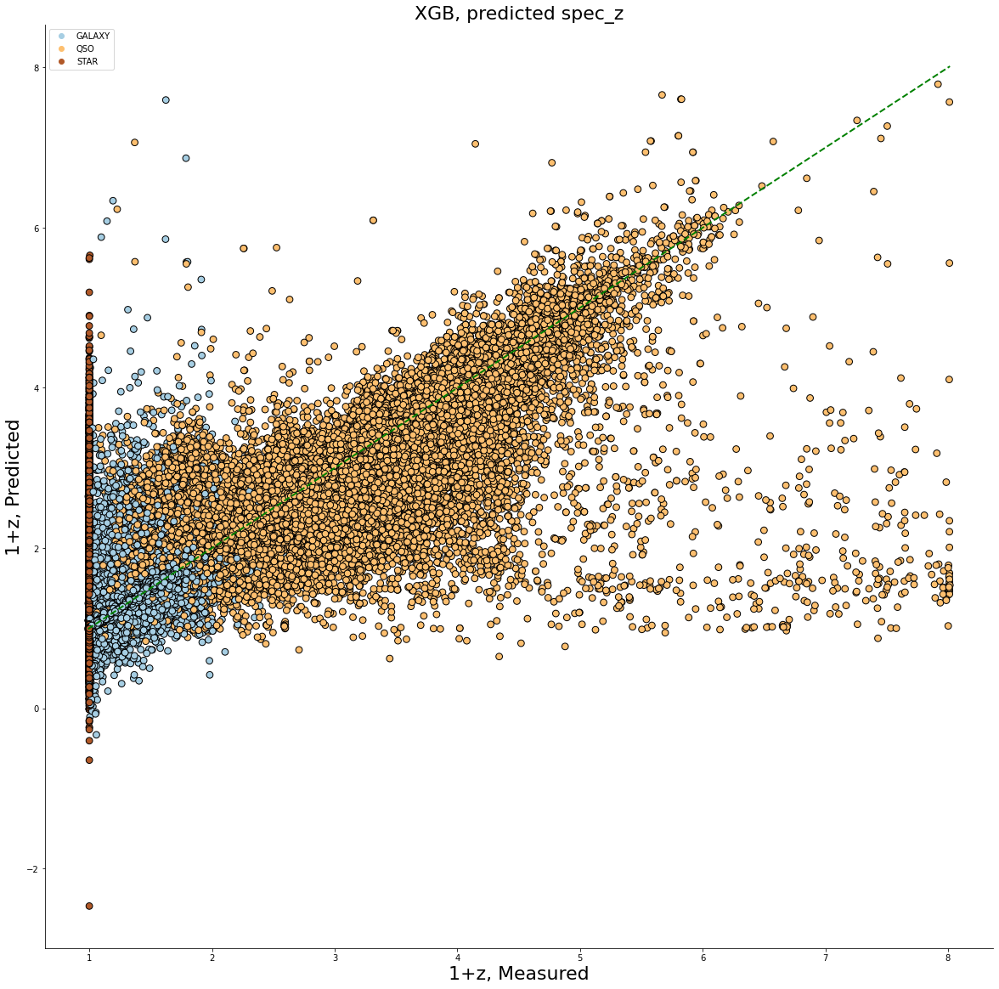

In [9]:
create_rgr_plot(y_test, xgb_pred, 'z', 'XGB, predicted spec_z')

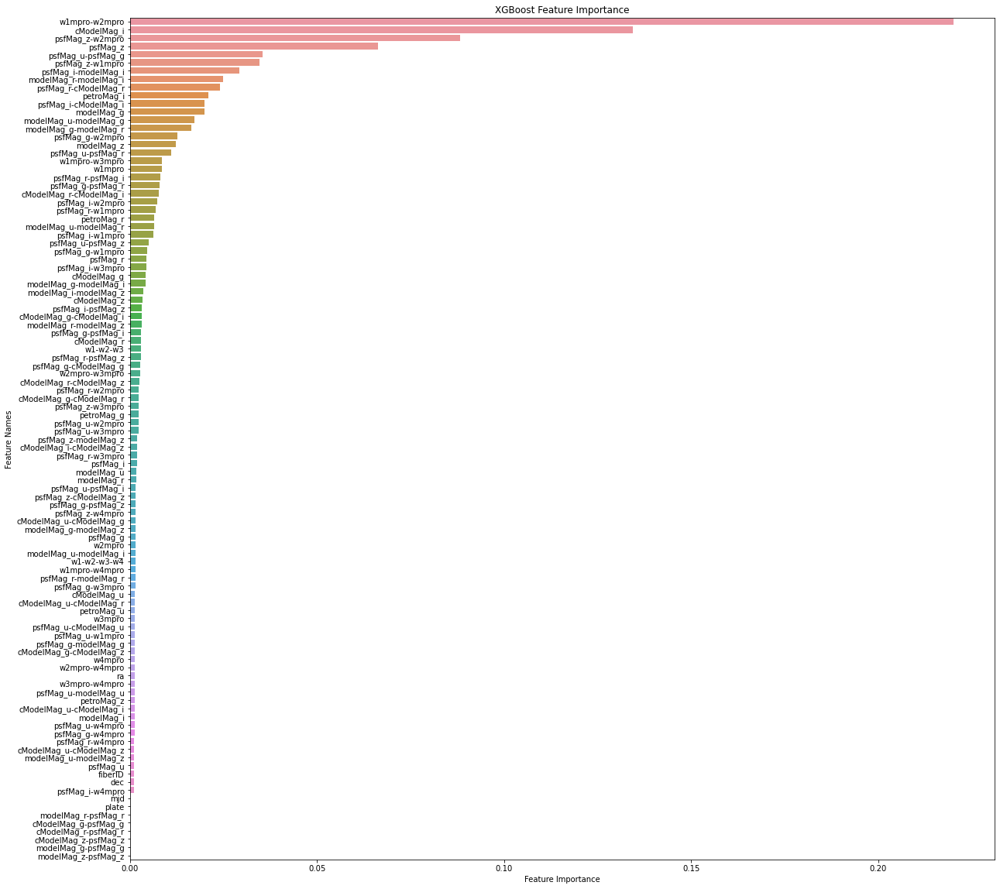

In [10]:
plot_feature_importance(xgb_feat_importance,features,'XGBoost')

## CatBoost

In [11]:
train_pool = Pool(X_train, y_train['z'], feature_names=features)
test_pool = Pool(X_test, y_test['z'], feature_names=features)

In [12]:
cb_model = CatBoostRegressor(iterations=1500, max_depth=10, task_type="GPU",random_seed=0, verbose=0)
                          
cb_model.fit(train_pool)
z_cb_pred = cb_model.predict(X_test.astype(np.float32))

#Metric NMAD
metric_scores_rgr(y_test['z'].reset_index(drop=True), z_cb_pred)

Outliers: 
 not outlier    1020914
outlier          21562
dtype: int64

 Bias: 
 0.008214186561343092

 NMAD score: 
 0.012156996110787776

 R2 Test: 
 0.9046615645027404


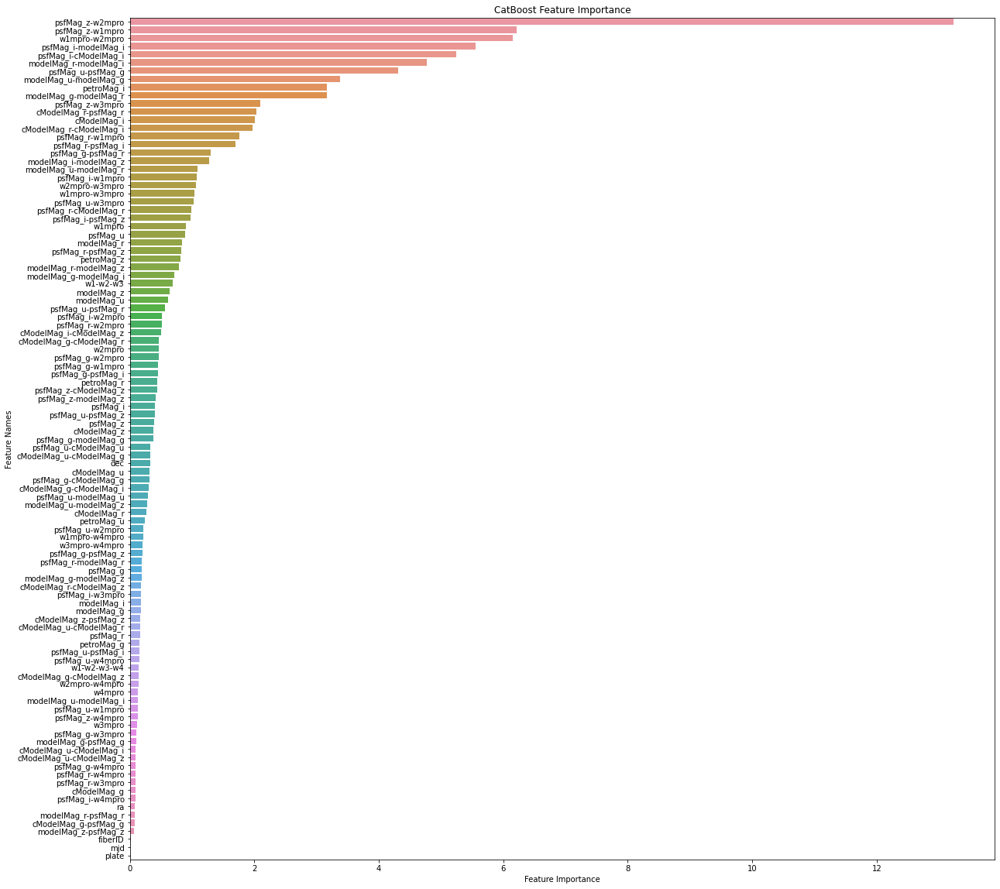

In [13]:
plot_feature_importance(cb_model.get_feature_importance(),features,'CatBoost')

<module 'matplotlib.pyplot' from '/opt/conda/envs/rapids/lib/python3.7/site-packages/matplotlib/pyplot.py'>

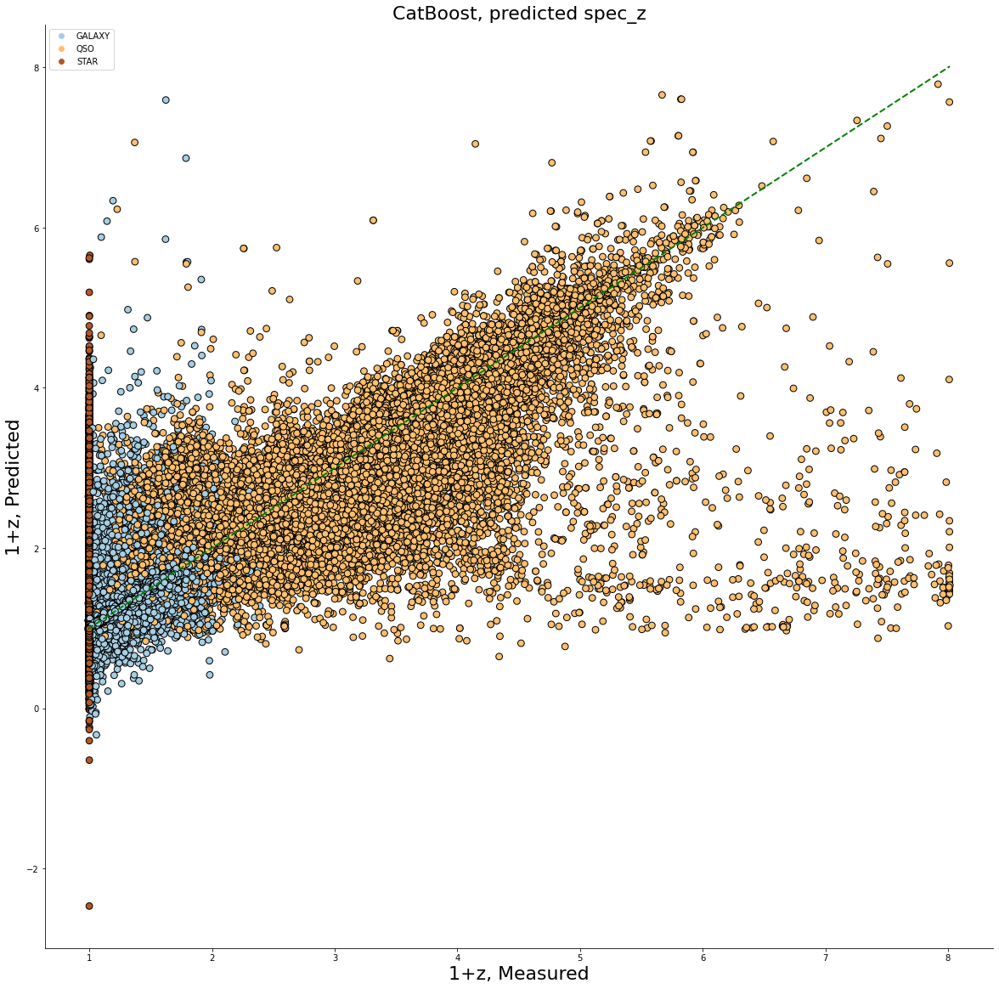

In [14]:
create_rgr_plot(y_test, xgb_pred, 'z', 'CatBoost, predicted spec_z')

## LightGBM

In [15]:
lgb_clf = lgb.LGBMRegressor(n_estimators=1500,random_seed=0, verbose=0)
                          
lgb_pred, lgb_feat_importance = ml_model(lgb_clf, X_train, y_train, X_test, y_test, 'z')

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 1.093304 seconds.
You can set `force_col_wise=true` to remove the overhead.
Outliers: 
 not outlier    1021005
outlier          21471
dtype: int64

 Bias: 
 0.00812060294585834

 NMAD score: 
 0.012018492359870344

 R2 Test: 
 0.9033163065763283
None


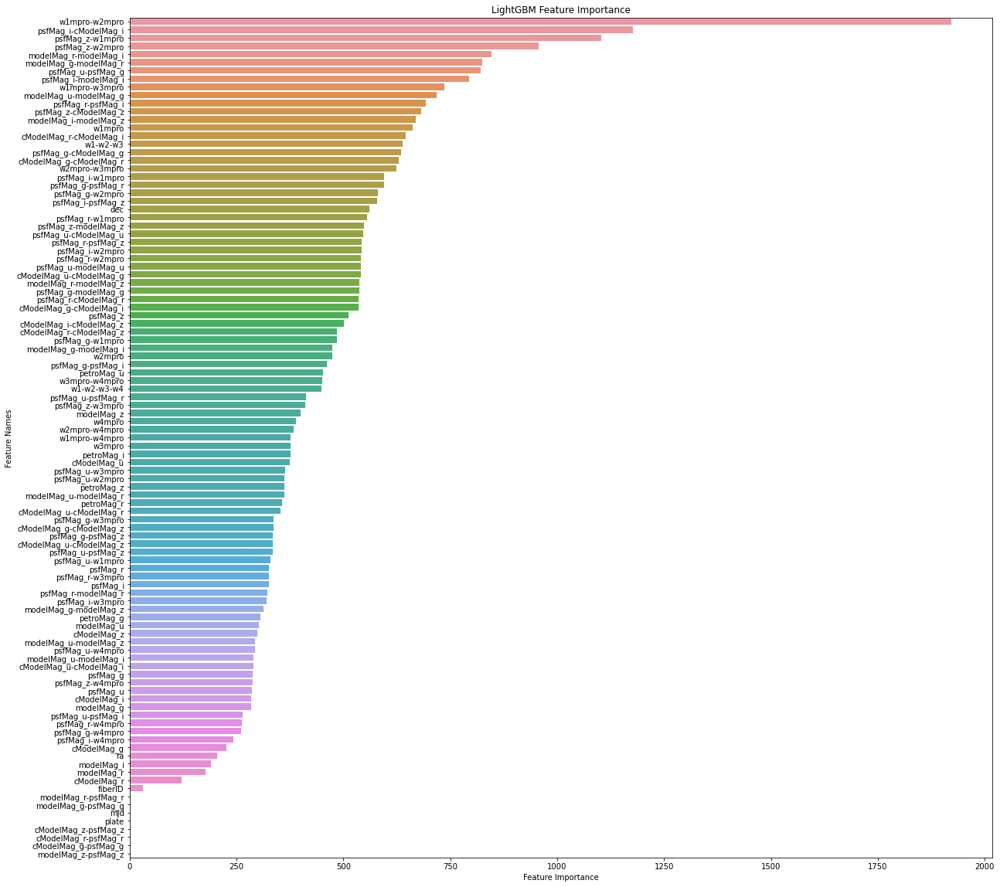

In [16]:
plot_feature_importance(lgb_feat_importance,features,'LightGBM')

<module 'matplotlib.pyplot' from '/opt/conda/envs/rapids/lib/python3.7/site-packages/matplotlib/pyplot.py'>

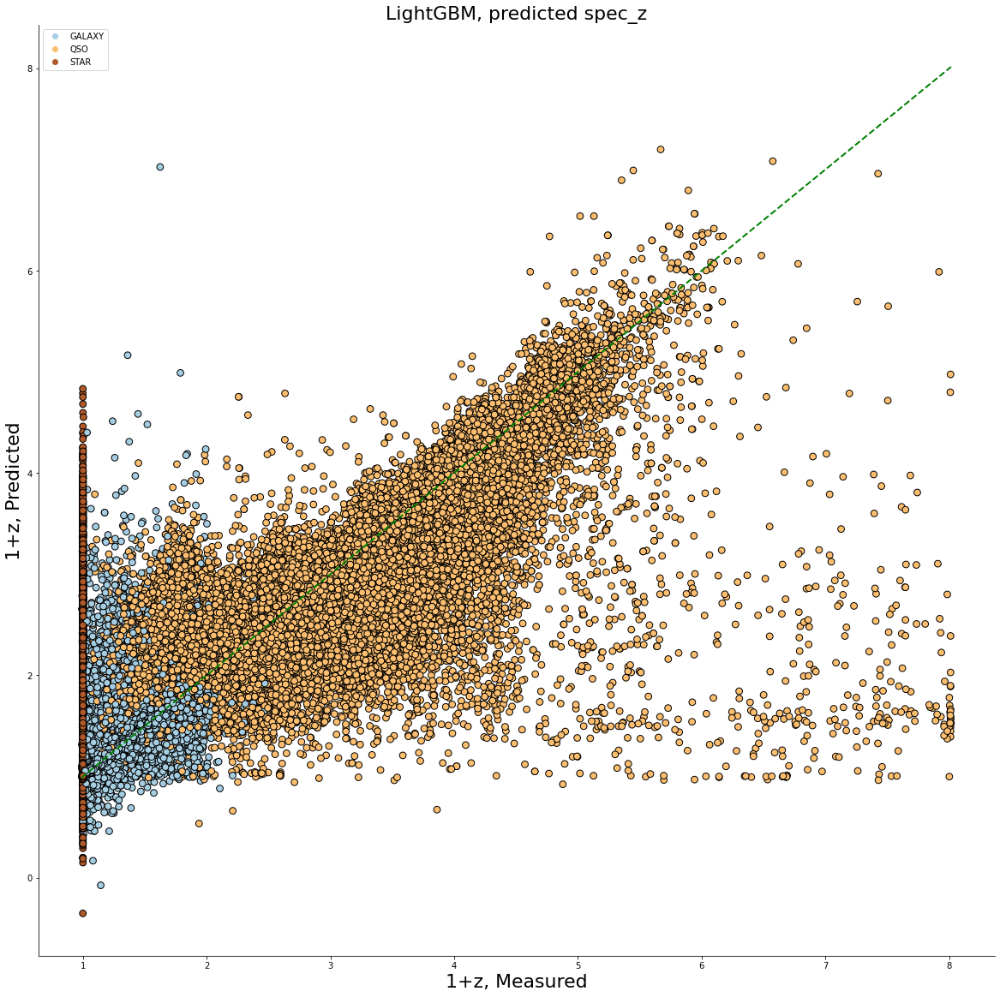

In [17]:
create_rgr_plot(y_test, lgb_pred, 'z', 'LightGBM, predicted spec_z')

# OOF Predictions 

In [9]:
models = {'xgb':xgb.XGBRegressor(n_estimators=1500, n_jobs=-1,tree_method='gpu_hist', random_state=24),
        'cb':CatBoostRegressor(iterations=1500, task_type="GPU",random_seed=0, verbose=0),
        'lgb':lgb.LGBMRegressor(n_estimators=1500,random_seed=0, verbose=0)}

In [10]:
train_meta = pd.DataFrame(index=X_train.index,columns=[*models])
test_meta = pd.DataFrame(index=X_test.index,columns=[*models])

In [11]:
for i, model_name in enumerate([*models]):
    if i==0: print('Starting OOF predictions for all models. \n')
    train_meta[model_name], test_meta[model_name] = kf_oof(models[model_name],X_train,y_train,X_test,'z', nkf=5)
    print('Predictions for '+str(model_name)+' done!')

Starting OOF predictions for all models. 

For cycle loop: 1
For cycle loop: 2
For cycle loop: 3
For cycle loop: 4
For cycle loop: 5
For cycle loop: 6
For cycle loop: 7
For cycle loop: 8
For cycle loop: 9
For cycle loop: 10
For cycle loop: 11
For cycle loop: 12
For cycle loop: 13
For cycle loop: 14
For cycle loop: 15
For cycle loop: 16
For cycle loop: 17
For cycle loop: 18
For cycle loop: 19
For cycle loop: 20
For cycle loop: 21
For cycle loop: 22
For cycle loop: 23
For cycle loop: 24
For cycle loop: 25
For cycle loop: 26
For cycle loop: 27
For cycle loop: 28
For cycle loop: 29
For cycle loop: 30
For cycle loop: 31
For cycle loop: 32
For cycle loop: 33
For cycle loop: 34
For cycle loop: 35
For cycle loop: 36
For cycle loop: 37
For cycle loop: 38
For cycle loop: 39
For cycle loop: 40
For cycle loop: 41
For cycle loop: 42
For cycle loop: 43
For cycle loop: 44
For cycle loop: 45
For cycle loop: 46
For cycle loop: 47
For cycle loop: 48
For cycle loop: 49
For cycle loop: 50
Predictions for 

For cycle loop: 34
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.525370 seconds.
You can set `force_col_wise=true` to remove the overhead.
For cycle loop: 35
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.143778 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
For cycle loop: 36
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.574275 seconds.
You can set `force_col_wise=true` to remove the overhead.
For cycle loop: 37
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.768452 seconds.
You can set `force_col_wise=true` to remove the overhead.
For cycle loop: 38
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.569411 seconds.
You can set `force_col_wise=true` to remove the overhead.
For cycle loop: 

In [12]:
# let's take a look at the features for training our meta learner:
test_meta['average'] = test_meta[[*models]].mean(axis=1)
train_meta['average'] = train_meta[[*models]].mean(axis=1)

In [13]:
metric_scores_rgr(y_test['z'], test_meta['average'])

Outliers: 
 not outlier    1021210
outlier          21266
dtype: int64

 Bias: 
 0.00768049166204832

 NMAD score: 
 0.011367127659831514

 R2 Test: 
 0.9060944547519014


<module 'matplotlib.pyplot' from '/opt/conda/envs/rapids/lib/python3.7/site-packages/matplotlib/pyplot.py'>

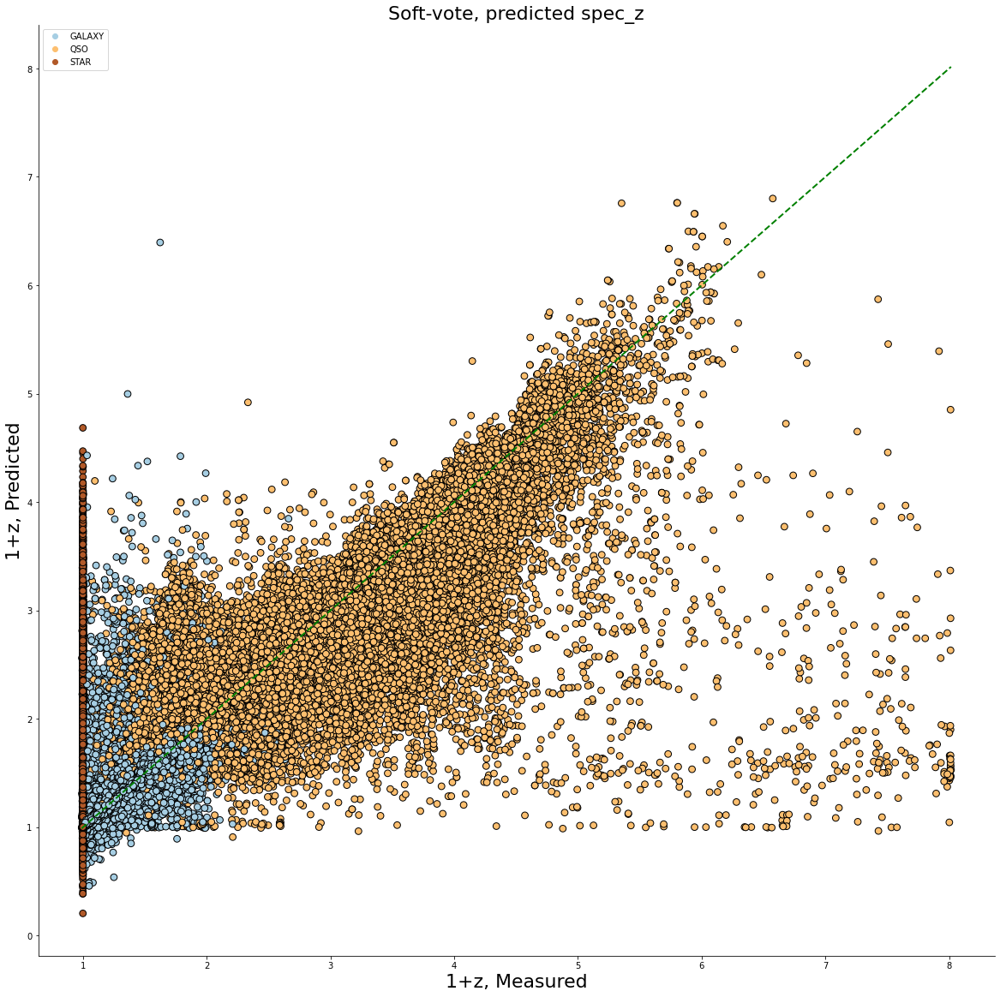

In [14]:
create_rgr_plot(y_test, test_meta['average'], 'z', 'Soft-vote, predicted spec_z')

In [15]:
metric_scores_rgr(y_train['z'], train_meta['average'])

Outliers: 
 not outlier    2381432
outlier          51010
dtype: int64

 Bias: 
 0.007997344059931667

 NMAD score: 
 0.011836069208698867

 R2 Test: 
 0.9014934875435346


<module 'matplotlib.pyplot' from '/opt/conda/envs/rapids/lib/python3.7/site-packages/matplotlib/pyplot.py'>

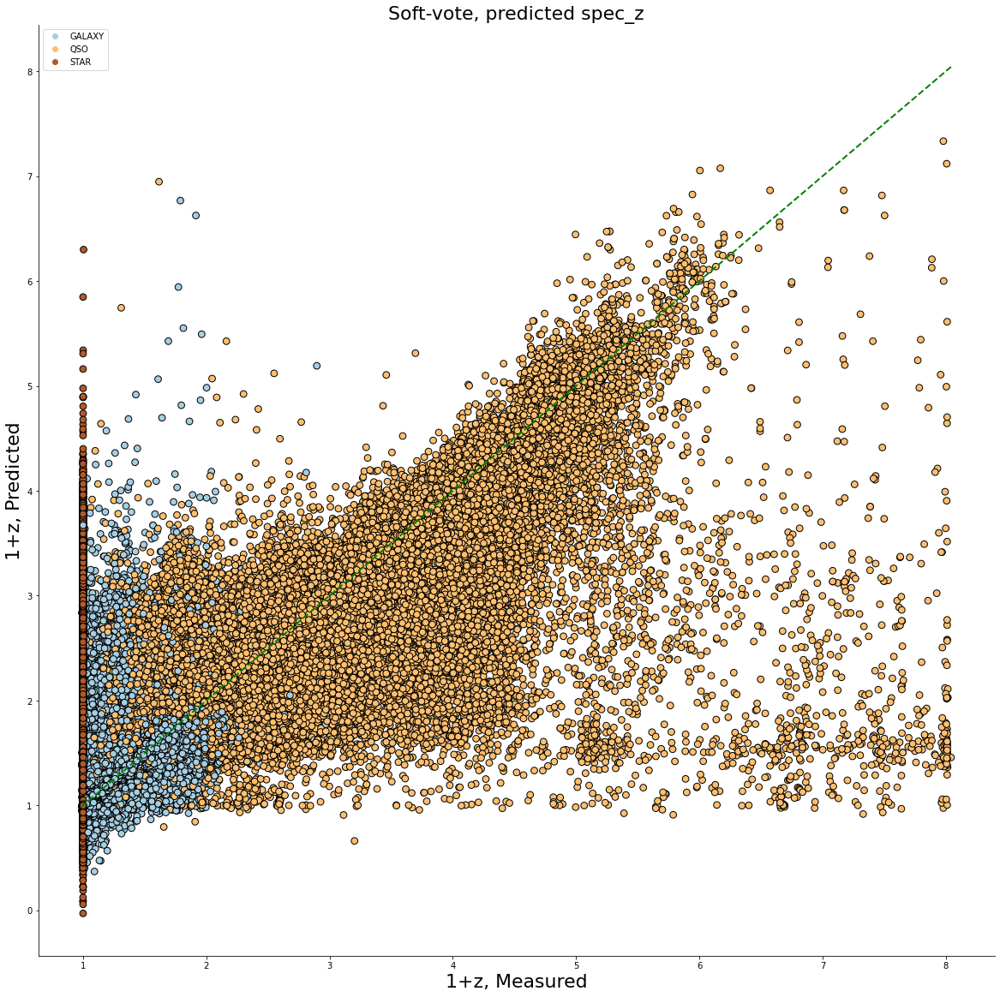

In [16]:
create_rgr_plot(y_train, train_meta['average'], 'z', 'Soft-vote, predicted spec_z')

In [17]:
test_predictions = pd.DataFrame(test_meta['average'], index=X_test.index)
train_predictions = pd.DataFrame(train_meta['average'], index=X_train.index)

oof_z_spec_pred = pd.concat([train_predictions,test_predictions],axis=0).sort_index()

oof_z_spec_pred.to_csv('./Data/oof_z_pred_v1.csv', index=True)

# Photo_z predictions correction

In [8]:
df_z = pd.read_csv('./Data/oof_z_pred_v1.csv')

In [9]:
df_z.columns=['index','photo_z']
df_z.set_index('index', inplace=True)
df = pd.merge(df,df_z, left_index=True, right_index=True)

In [10]:
df

,specObjID,psfMag_u,psfMag_g,psfMag_r,psfMag_i,psfMag_z,w1mpro,w2mpro,w3mpro,w4mpro,...,psfMag_z-w4mpro,w1mpro-w2mpro,w1mpro-w3mpro,w1mpro-w4mpro,w2mpro-w3mpro,w2mpro-w4mpro,w3mpro-w4mpro,w1-w2-w3,w1-w2-w3-w4,photo_z
0,299489676975171584,19.086210,17.417789,16.595810,16.034969,15.680770,11.856000,11.872,9.154,7.836,...,7.84477,0.016,2.702,4.020,2.718,4.036,1.318,9.170,17.006001,1.036304
1,299489677444933632,19.086210,17.417789,16.595810,16.034969,15.680770,11.856000,11.872,9.154,7.836,...,7.84477,0.016,2.702,4.020,2.718,4.036,1.318,9.170,17.006001,1.038660
2,299489951853078528,22.678499,20.570419,19.164761,18.745230,18.312450,14.574000,14.207,11.902,8.626,...,9.68645,0.367,2.672,5.948,2.305,5.581,3.276,11.535,20.160999,1.212356
3,299489952322840576,22.343210,20.316629,18.933720,18.372570,17.988461,14.226000,13.918,12.521,9.106,...,8.88246,0.308,1.705,5.120,1.397,4.812,3.415,12.213,21.319000,1.222090
4,299490226730985472,20.024401,19.601589,19.492901,19.371880,19.298290,15.102000,14.071,11.880,8.372,...,10.92629,1.031,3.222,6.730,2.191,5.699,3.508,10.849,19.221001,1.647775
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3474913,11259270496166846464,23.912531,23.555460,22.746799,21.878040,20.049231,15.729000,15.002,11.273,8.584,...,11.46523,0.727,4.456,7.145,3.729,6.418,2.689,10.546,19.129999,1.962466
3474914,11259270771044753408,19.719530,19.538170,19.356890,18.952471,18.992161,15.687000,14.676,11.301,8.737,...,10.25516,1.011,4.386,6.950,3.375,5.939,2.564,10.290,19.027000,2.828626
3474915,11259271045922660352,26.007179,23.568859,22.621071,21.113041,20.064899,16.054001,15.412,11.976,7.921,...,12.14390,0.642,4.078,8.133,3.436,7.491,4.055,11.334,19.254999,1.582801
3474916,11259271320800567296,24.128031,22.385111,21.015579,20.358210,19.912359,16.104000,15.665,12.139,8.793,...,11.11936,0.439,3.965,7.311,3.526,6.872,3.346,11.700,20.493000,1.435037


In [11]:
# Create features
features = df.columns.to_list()
features.remove('class')
features.remove('z')
features.remove('specObjID')

targets = ['class','z','specObjID']

X_train, X_test, y_train, y_test = skl_train_test_split(df[features], 
                                                    df[targets], 
                                                    test_size=0.3, 
                                                    shuffle =True, 
                                                    random_state=24)

## XGBoost

In [24]:
# XGBoost implementation
xgb_clf = xgb.XGBRegressor(n_estimators=1500, n_jobs=-1,tree_method='gpu_hist', random_state=24)

xgb_pred, xgb_feat_importance = ml_model(xgb_clf, X_train, y_train, X_test, y_test, 'z')

Outliers: 
 not outlier    1024404
outlier          18072
dtype: int64

 Bias: 
 0.006946938943949953

 NMAD score: 
 0.01028146963704593

 R2 Test: 
 0.9090901954423972
None


<module 'matplotlib.pyplot' from '/opt/conda/envs/rapids/lib/python3.7/site-packages/matplotlib/pyplot.py'>

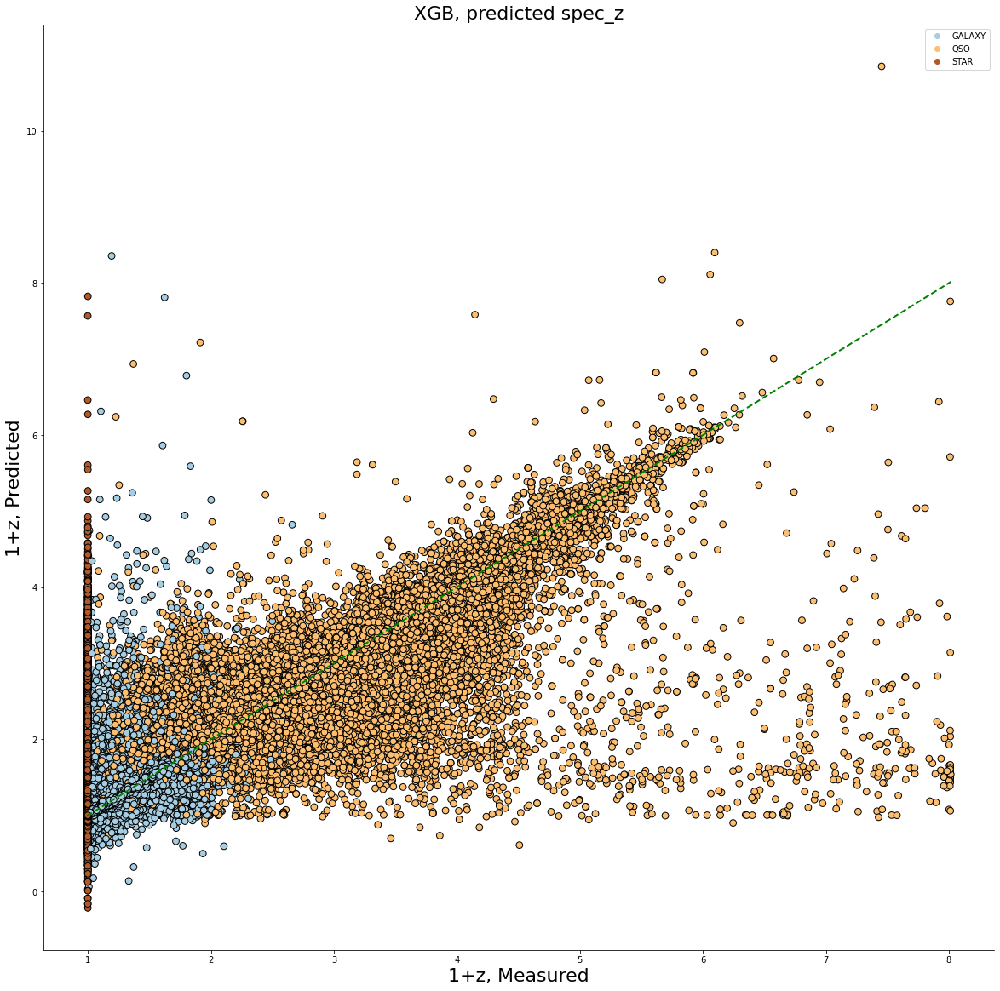

In [25]:
create_rgr_plot(y_test, xgb_pred, 'z', 'XGB, predicted spec_z')

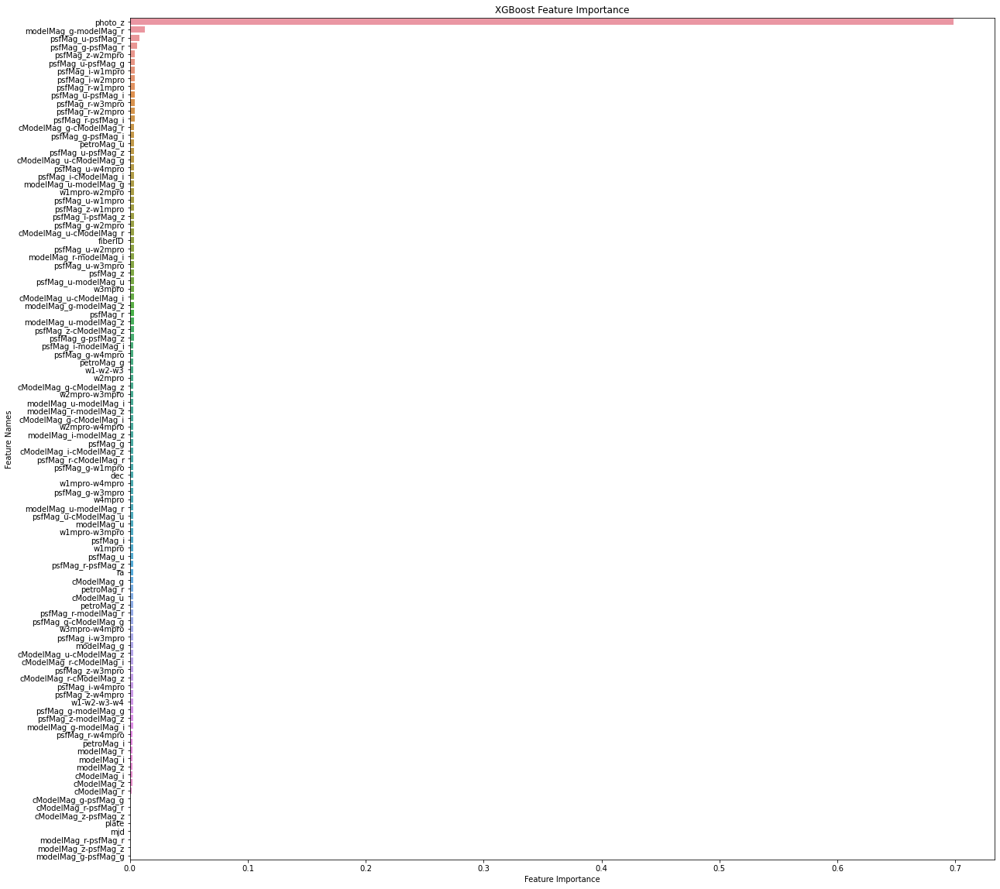

In [26]:
plot_feature_importance(xgb_feat_importance,features,'XGBoost')

## Catboost

In [12]:
train_pool = Pool(X_train, y_train['z'], feature_names=features)
test_pool = Pool(X_test, y_test['z'], feature_names=features)

cb_model = CatBoostRegressor(iterations=1500, max_depth=10, task_type="GPU",random_seed=0, verbose=0)
                          
cb_model.fit(train_pool)
z_cb_pred = cb_model.predict(X_test.astype(np.float32))

#Metric NMAD
metric_scores_rgr(y_test['z'].reset_index(drop=True), z_cb_pred)

Outliers: 
 not outlier    1025546
outlier          16930
dtype: int64

 Bias: 
 0.007073274614967654

 NMAD score: 
 0.010468446430152129

 R2 Test: 
 0.9143085201752823


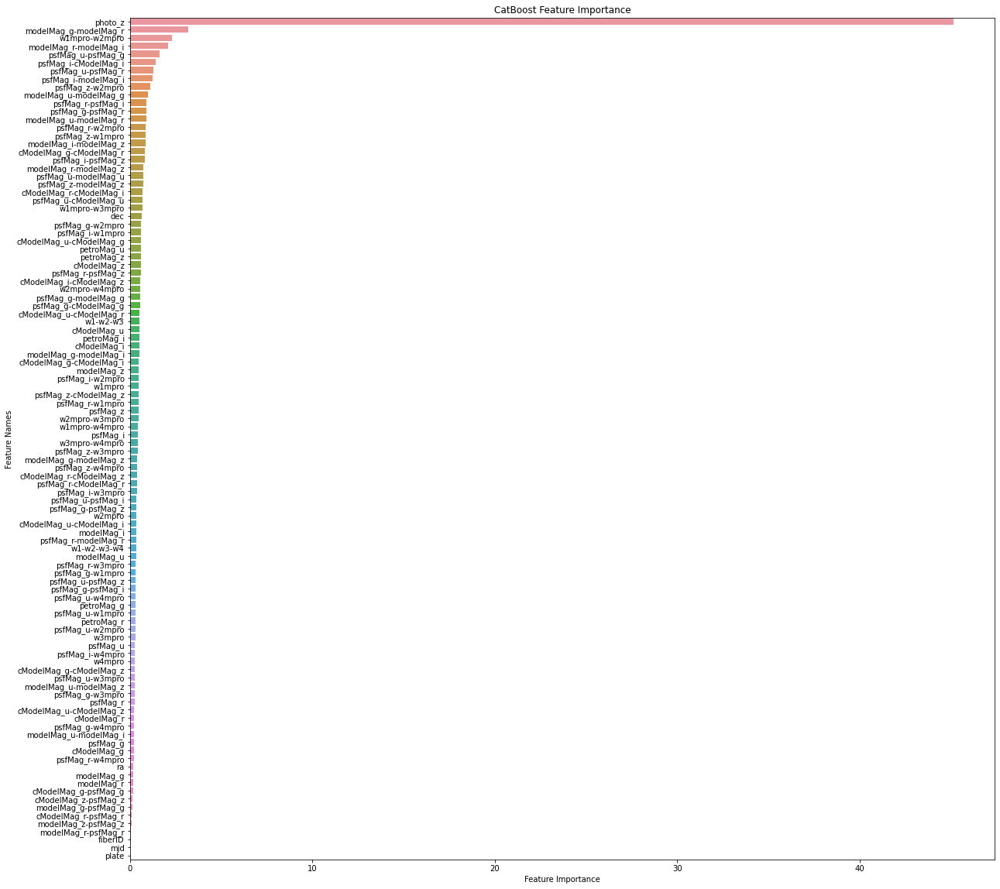

In [13]:
plot_feature_importance(cb_model.get_feature_importance(),features,'CatBoost')

<module 'matplotlib.pyplot' from '/opt/conda/envs/rapids/lib/python3.7/site-packages/matplotlib/pyplot.py'>

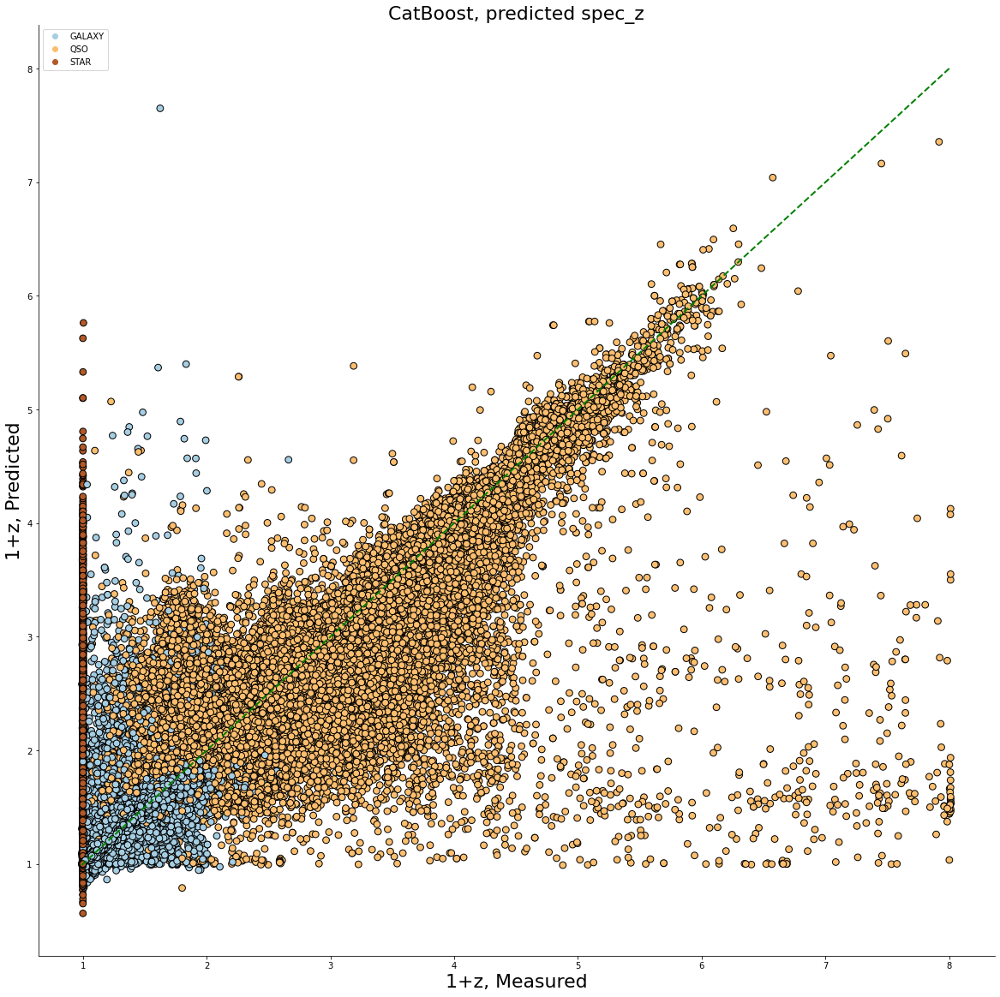

In [16]:
create_rgr_plot(y_test, z_cb_pred, 'z', 'CatBoost, predicted spec_z')

## LightGBM

In [17]:
lgb_clf = lgb.LGBMRegressor(n_estimators=1500,random_seed=0, verbose=0)
                          
lgb_pred, lgb_feat_importance = ml_model(lgb_clf, X_train, y_train, X_test, y_test, 'z')

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.768581 seconds.
You can set `force_col_wise=true` to remove the overhead.
Outliers: 
 not outlier    1025665
outlier          16811
dtype: int64

 Bias: 
 0.0069307469146132495

 NMAD score: 
 0.01025750543362761

 R2 Test: 
 0.9145140304200549
None


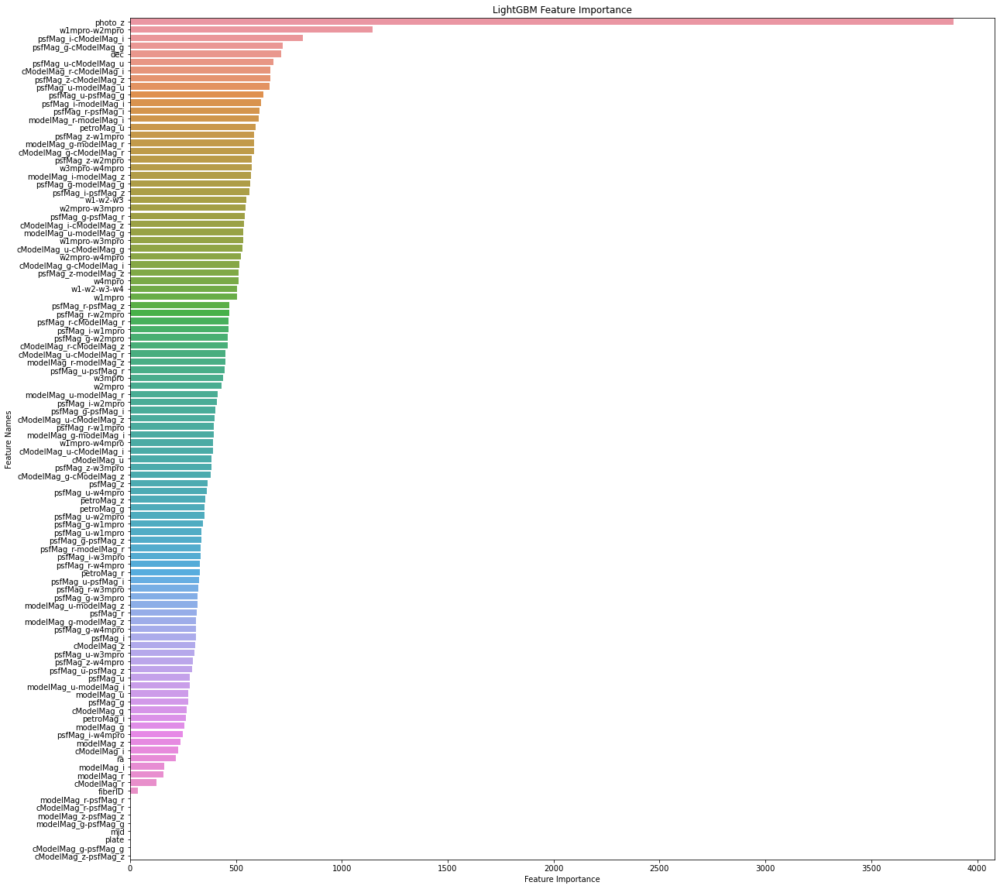

In [18]:
plot_feature_importance(lgb_feat_importance,features,'LightGBM')

<module 'matplotlib.pyplot' from '/opt/conda/envs/rapids/lib/python3.7/site-packages/matplotlib/pyplot.py'>

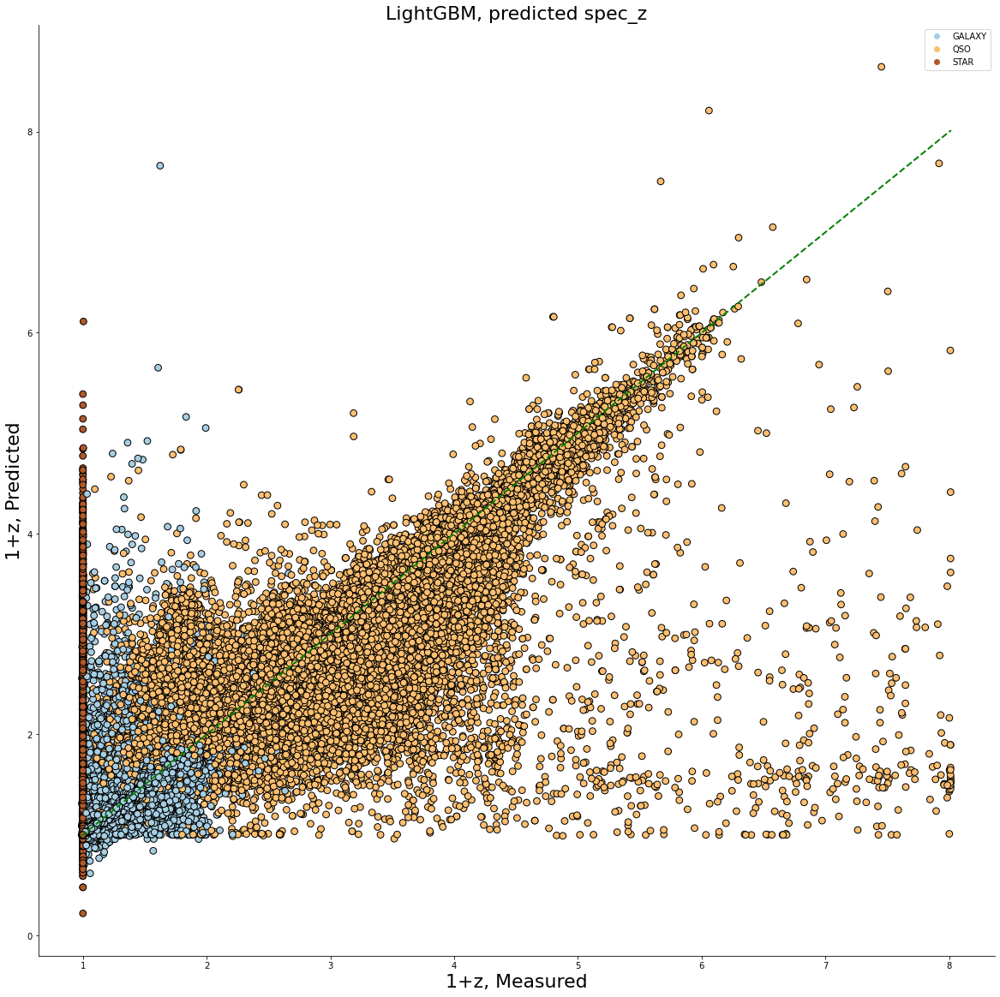

In [19]:
create_rgr_plot(y_test, lgb_pred, 'z', 'LightGBM, predicted spec_z')

## OOF preds

In [21]:
models = {'xgb':xgb.XGBRegressor(n_estimators=1500, n_jobs=-1,tree_method='gpu_hist', random_state=24),
        'cb':CatBoostRegressor(iterations=1500, task_type="GPU",random_seed=0, verbose=0),
        'lgb':lgb.LGBMRegressor(n_estimators=1500,random_seed=0, verbose=0)}

In [22]:
train_meta = pd.DataFrame(index=X_train.index,columns=[*models])
test_meta = pd.DataFrame(index=X_test.index,columns=[*models])

In [23]:
for i, model_name in enumerate([*models]):
    if i==0: print('Starting OOF predictions for all models. \n')
    train_meta[model_name], test_meta[model_name] = kf_oof(models[model_name],X_train,y_train,X_test,'z', nkf=5)
    print('Predictions for '+str(model_name)+' done!')

Starting OOF predictions for all models. 

For cycle loop: 1
For cycle loop: 2
For cycle loop: 3
For cycle loop: 4
For cycle loop: 5
For cycle loop: 6
For cycle loop: 7
For cycle loop: 8
For cycle loop: 9
For cycle loop: 10
For cycle loop: 11
For cycle loop: 12
For cycle loop: 13
For cycle loop: 14
For cycle loop: 15
For cycle loop: 16
For cycle loop: 17
For cycle loop: 18
For cycle loop: 19
For cycle loop: 20
For cycle loop: 21
For cycle loop: 22
For cycle loop: 23
For cycle loop: 24
For cycle loop: 25
For cycle loop: 26
For cycle loop: 27
For cycle loop: 28
For cycle loop: 29
For cycle loop: 30
For cycle loop: 31
For cycle loop: 32
For cycle loop: 33
For cycle loop: 34
For cycle loop: 35
For cycle loop: 36
For cycle loop: 37
For cycle loop: 38
For cycle loop: 39
For cycle loop: 40
For cycle loop: 41
For cycle loop: 42
For cycle loop: 43
For cycle loop: 44
For cycle loop: 45
For cycle loop: 46
For cycle loop: 47
For cycle loop: 48
For cycle loop: 49
For cycle loop: 50
Predictions for 

For cycle loop: 32
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.530971 seconds.
You can set `force_col_wise=true` to remove the overhead.
For cycle loop: 33
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.755017 seconds.
You can set `force_col_wise=true` to remove the overhead.
For cycle loop: 34
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.688439 seconds.
You can set `force_col_wise=true` to remove the overhead.
For cycle loop: 35
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.734040 seconds.
You can set `force_col_wise=true` to remove the overhead.
For cycle loop: 36
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.734371 seconds.
You can set `force_col_wise=true` to remove the overhead.
For cycle loop: 37
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, 

In [24]:
# let's take a look at the features for training our meta learner:
test_meta['average'] = test_meta[[*models]].mean(axis=1)
train_meta['average'] = train_meta[[*models]].mean(axis=1)

In [25]:
metric_scores_rgr(y_test['z'], test_meta['average'])

Outliers: 
 not outlier    1025977
outlier          16499
dtype: int64

 Bias: 
 0.0067181408812086955

 NMAD score: 
 0.009942848504188868

 R2 Test: 
 0.9160139257413803


In [26]:
metric_scores_rgr(y_train['z'], train_meta['average'])

Outliers: 
 not outlier    2391923
outlier          40519
dtype: int64

 Bias: 
 0.0069846357547989745

 NMAD score: 
 0.010337260917102482

 R2 Test: 
 0.9086403524681103


<module 'matplotlib.pyplot' from '/opt/conda/envs/rapids/lib/python3.7/site-packages/matplotlib/pyplot.py'>

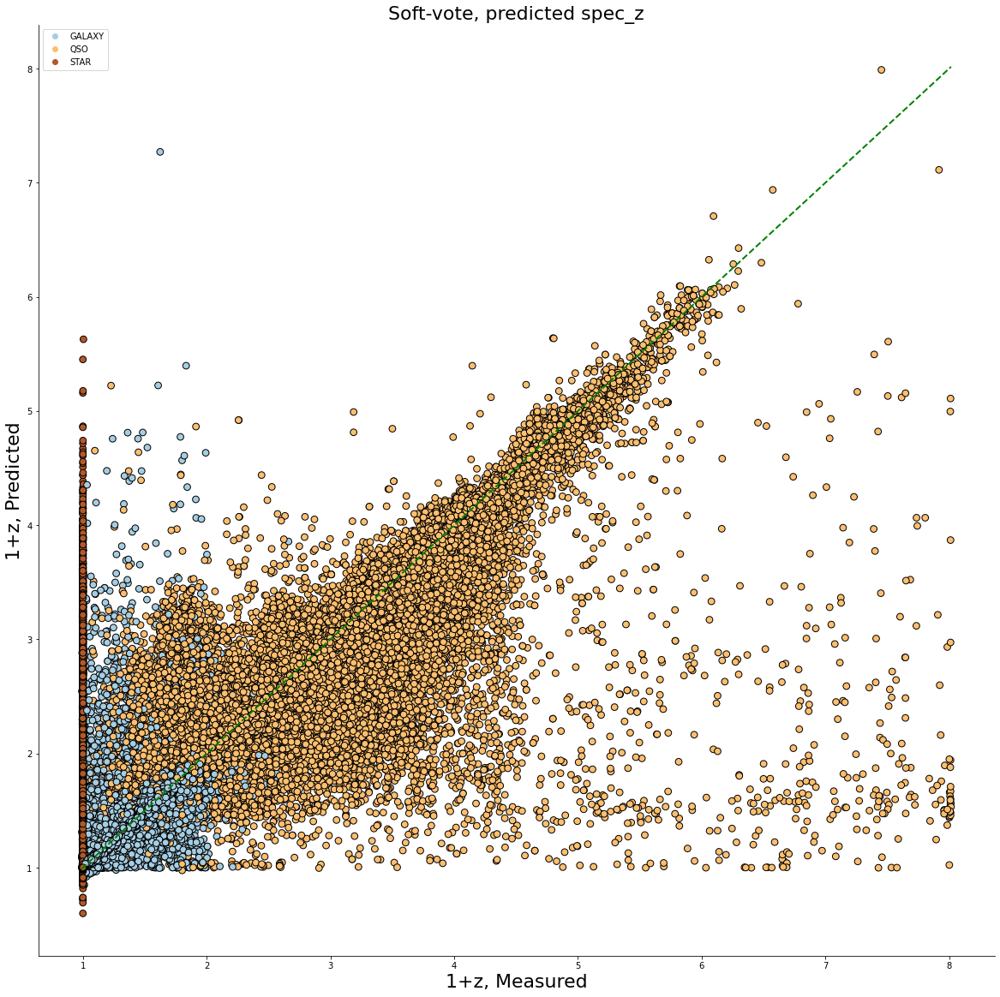

In [27]:
create_rgr_plot(y_test, test_meta['average'], 'z', 'Soft-vote, predicted spec_z')

<module 'matplotlib.pyplot' from '/opt/conda/envs/rapids/lib/python3.7/site-packages/matplotlib/pyplot.py'>

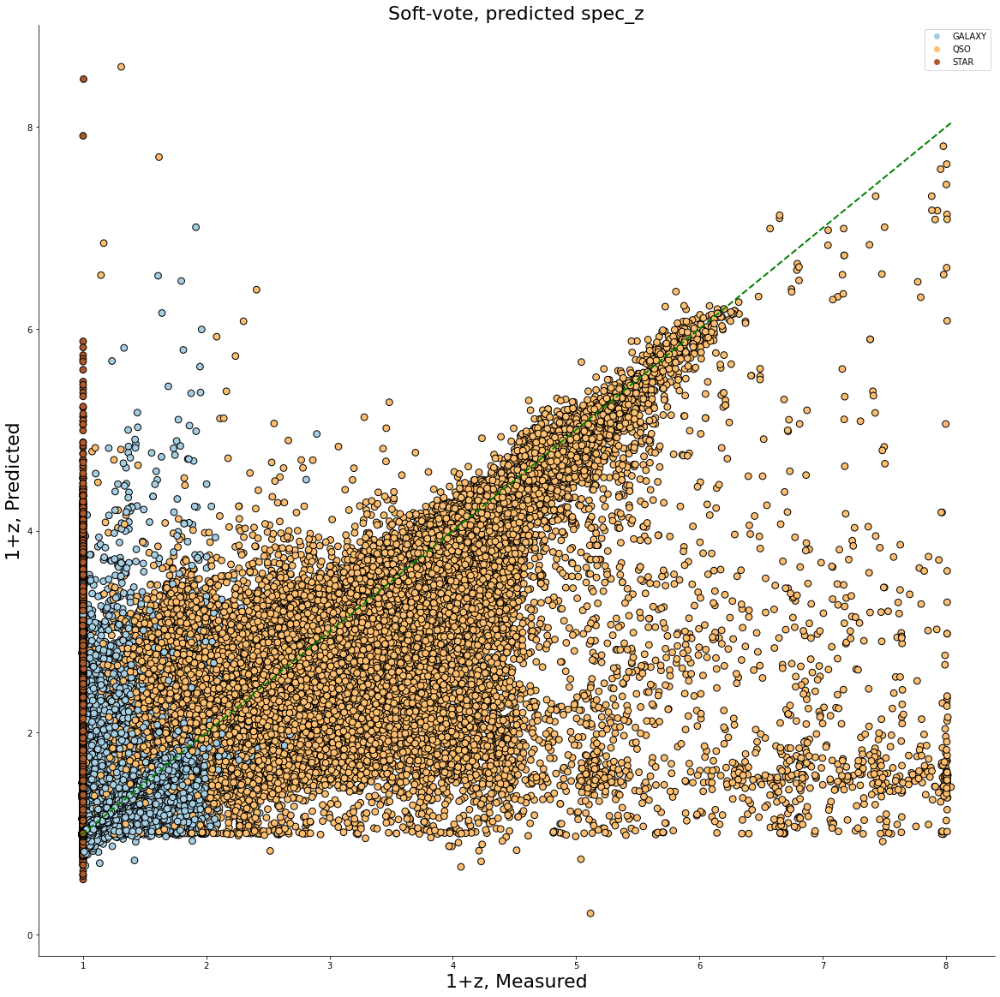

In [28]:
create_rgr_plot(y_train, train_meta['average'], 'z', 'Soft-vote, predicted spec_z')

In [29]:
test_predictions = pd.DataFrame(test_meta['average'], index=X_test.index)
train_predictions = pd.DataFrame(train_meta['average'], index=X_train.index)

oof_z_spec_pred = pd.concat([train_predictions,test_predictions],axis=0).sort_index()

oof_z_spec_pred.to_csv('./Data/oof_z_pred_v2.csv', index=True)